In [1]:
from copy import deepcopy
from itertools import combinations, product

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import homogeneity_score

In [2]:
DATASETS_2D = ['data/dane_2D_1.txt', 'data/dane_2D_2.txt', 'data/dane_2D_3.txt', 'data/dane_2D_4.txt',
               'data/dane_2D_5.txt', 'data/dane_2D_6.txt', 'data/dane_2D_7.txt', 'data/dane_2D_8.txt']

DATASETS_2D_Ks = [10, 10, 5, 5, 37, 17, 5, 5]

from sklearn.preprocessing import MinMaxScaler


def get_data_w_labels(filename):
    data = np.loadtxt(filename)
    x, y = np.hsplit(data, [-1])
    return MinMaxScaler().fit(x).transform(x), y


def get_data_wo_labels(filename):
    data = np.loadtxt(filename)
    return MinMaxScaler().fit(data).transform(data)


In [3]:
METHODS = ['single', 'full', 'avg', 'centr']


class Hierarchical:
    def __init__(self, method):
        def const(c):
            return lambda A, B: c

        assert method in METHODS
        if method == 'single':
            self._alpha_a, self._alpha_b, self._beta, self._gamma = const(.5), const(.5), const(0.), const(-.5)
        elif method == 'full':
            self._alpha_a, self._alpha_b, self._beta, self._gamma = const(.5), const(.5), const(0.), const(.5)
        elif method == 'avg':
            self._alpha_a = lambda A, B: A / (A + B)
            self._alpha_b = lambda A, B: B / (A + B)
            self._beta, self._gamma = const(0.), const(0.)
        elif method == 'centr':
            self._alpha_a = lambda A, B: A / (A + B)
            self._alpha_b = lambda A, B: B / (A + B)
            self._beta = lambda A, B: -A * B / ((A + B) ** 2)
            self._gamma = const(0.)

    @staticmethod
    def dist(x1, x2):
        return np.linalg.norm(x1 - x2)

    def cluster(self, x):
        n = len(x)
        cluster_ids, current_ids = [], np.array([i for i in range(n)])
        mapping = {i: i for i in range(n)}
        D = np.array([[self.dist(xi, xj) for xj in x] for xi in x], dtype=float)
        for i in range(len(x)):
            D[i, i] = np.inf
        for it in range(n - 1):
            assert len([mapping[i] for i in range(len(D))]) == len(D)
            assert len(set(current_ids)) == len(D) == n - it
            am = np.argmin(D)
            a, b = am // len(D), am % len(D)
            assert a != b
            a, b = min(a, b), max(a, b)
            A, B = np.count_nonzero(current_ids == mapping[a]), np.count_nonzero(current_ids == mapping[b])

            current_ids[current_ids == mapping[b]] = mapping[a]
            cluster_ids.append(deepcopy(current_ids))

            C = np.zeros_like(D[a])
            for d in range(len(D)):
                if d in [a, b]: continue
                C[d] = self._alpha_a(A, B) * D[d, a] + \
                       self._alpha_b(A, B) * D[d, b] + \
                       self._beta(A, B) * D[a, b] + \
                       self._gamma(A, B) * (abs(D[d, a] - D[d, b]))

            D[:, [b, -1]] = D[:, [-1, b]]
            D[[b, -1]] = D[[-1, b]]
            mapping[b] = mapping[len(D) - 1]
            C[[b, -1]] = C[[-1, b]]

            D = np.delete(D, -1, 0)
            D = np.delete(D, -1, 1)
            C = np.delete(C, -1)

            D[:, [a, -1]] = D[:, [-1, a]]
            D[[a, -1]] = D[[-1, a]]
            C[[a, -1]] = C[[-1, a]]
            C[-1] = np.inf
            D[:, -1] = D[-1, :] = C

            old_map = mapping[a]
            mapping[a] = mapping[len(D) - 1]
            mapping[len(D) - 1] = old_map

        return cluster_ids


In [4]:
def cost(x, ids):
    clusters = ((xi for i, xi in enumerate(x) if ids[i] == cid) for cid in set(ids))
    inner_costs = (sum(Hierarchical.dist(xi, xj) for xi, xj in combinations(cluster, 2)) for cluster in clusters)
    return sum(inner_costs)


In [5]:
def plot_clusters(ax, x, ids):
    ax.scatter(*np.hsplit(x, 2), c=ids, cmap='gist_rainbow', alpha=.6)


In [6]:
def handle_2D_dataset(x, y, dataset_name, method, max_k=10):
    errors, homo = [], []
    fig, _ = plt.subplots(int(max_k ** .5), int(max_k ** .5), figsize=(15, 15))
    cluster_ids = Hierarchical(method).cluster(x)[-max_k:-1]

    for k, ax, cids in zip(range(2, max_k + 1), fig.get_axes(), cluster_ids[::-1]):
        errors.append(cost(x, cids))
        homo.append(homogeneity_score(y, cids))
        plot_clusters(ax, x, cids)
        ax.set_title(f'{k} clusters')
        ax.label_outer()
    fig.tight_layout(pad=3.0)
    fig.suptitle(f'{dataset_name}: {method}', fontsize=40, y=1.03)

    fig, (ax_err, ax_homo) = plt.subplots(1, 2, figsize=(20, 10))
    ax_err.set_title(f'Number of clusters vs error')
    ax_err.plot(range(2, max_k + 1), errors, 'bx-', ms=10, mec='k')
    ax_err.axvline(len(set(y)), c='red')

    ax_homo.set_title(f'Number of clusters vs homogenity score')
    ax_homo.plot(range(2, max_k + 1), homo, 'bx-', ms=10, mec='k')
    ax_homo.axvline(len(set(y)), c='red')

    fig, ax_true = plt.subplots(figsize=(10, 10))
    plot_clusters(ax_true, x, y)
    ax_true.set_title(f'True clusters')
    plt.show()


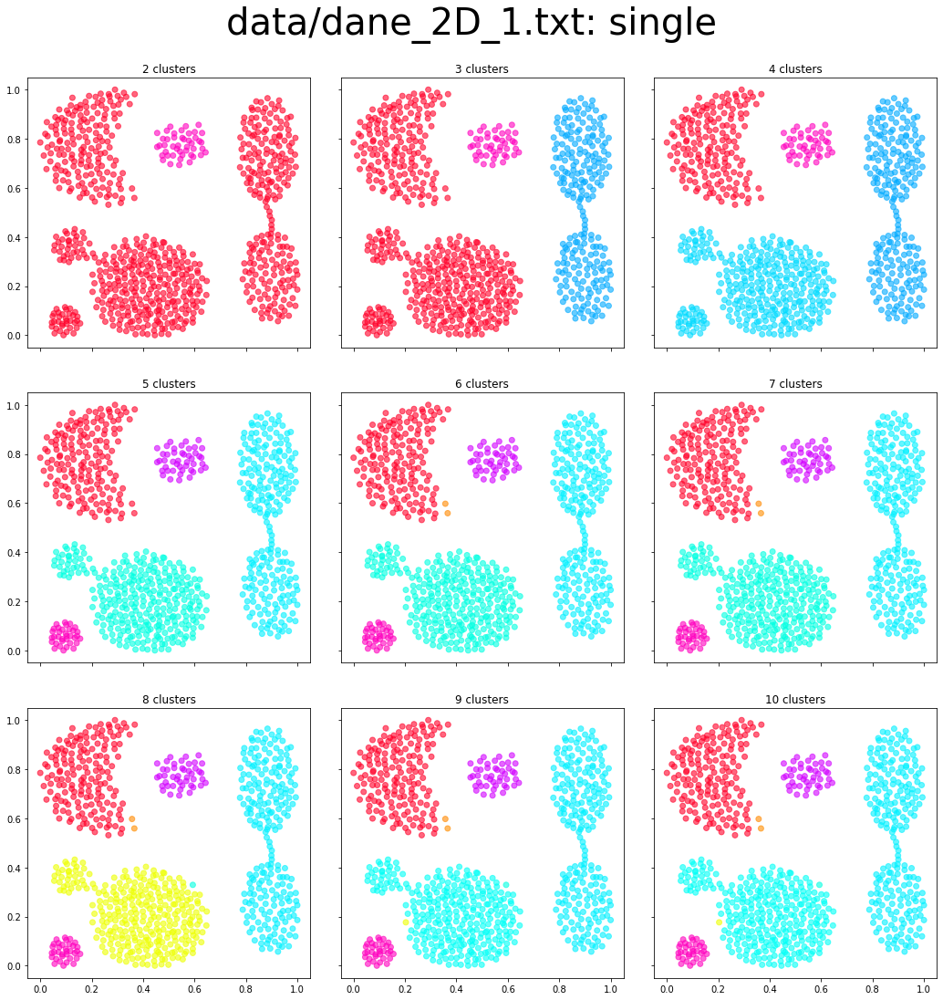

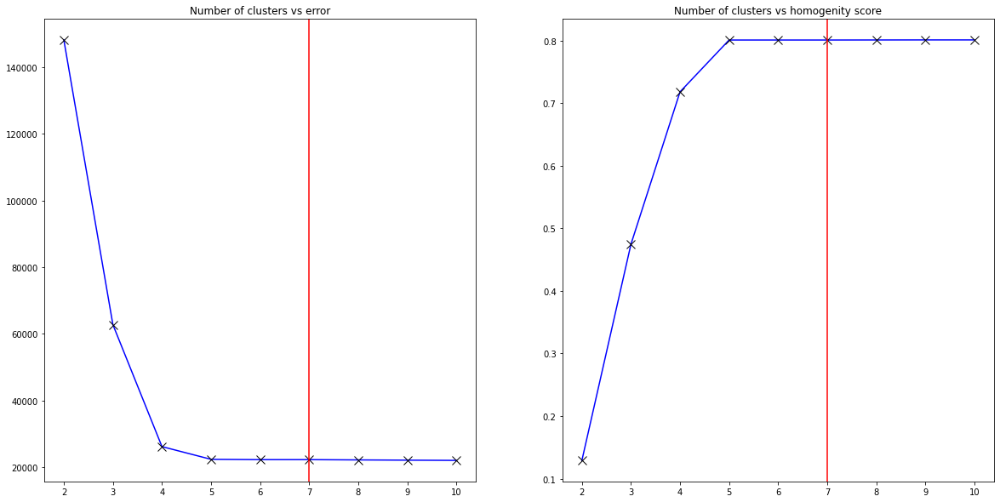

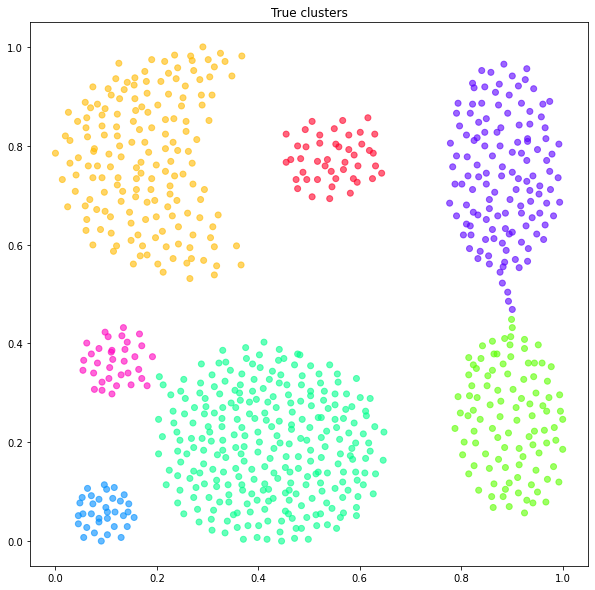

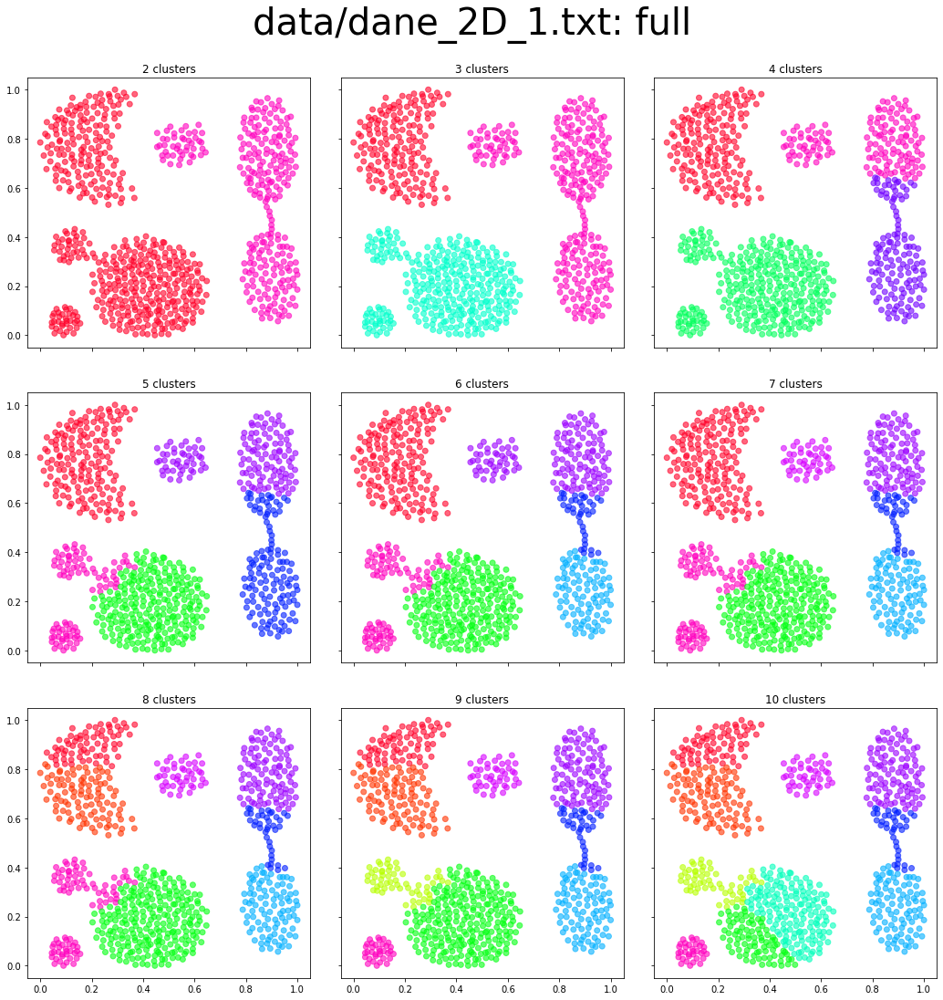

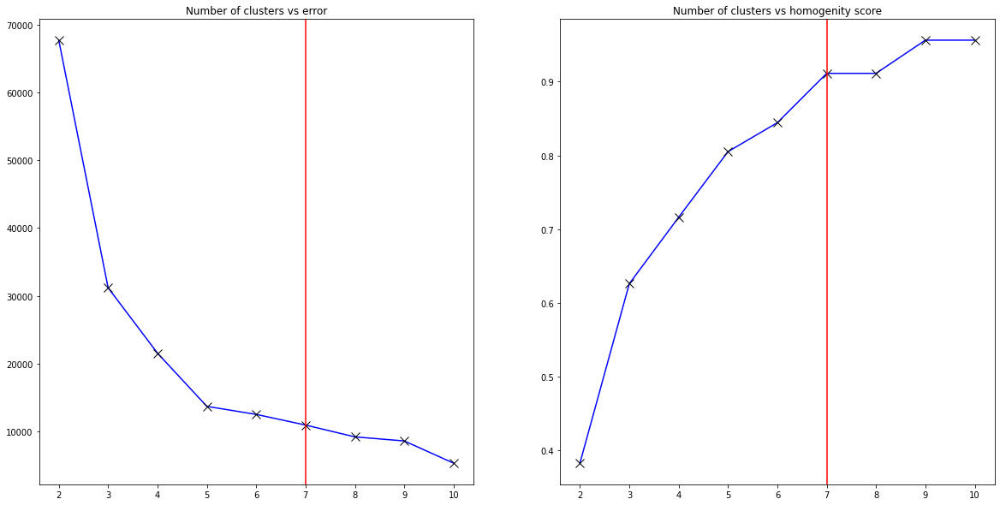

...

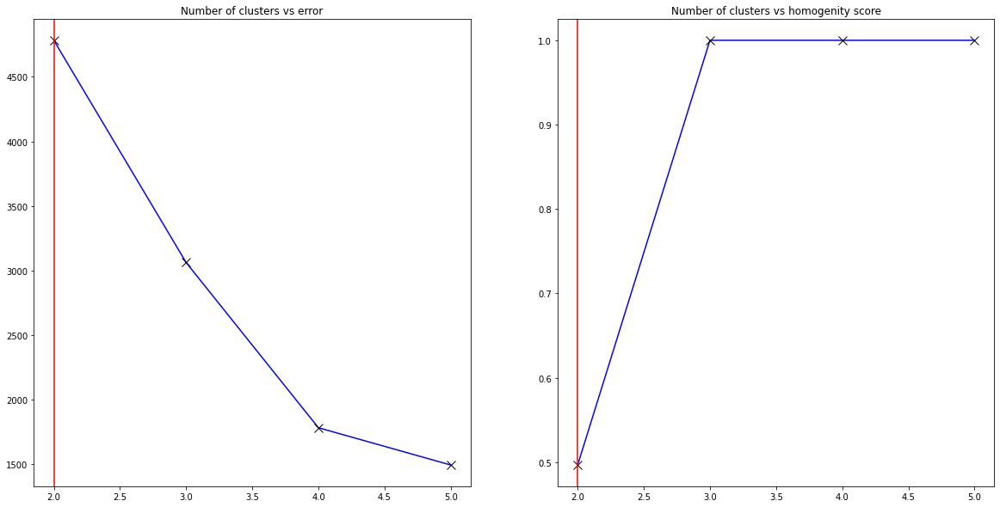

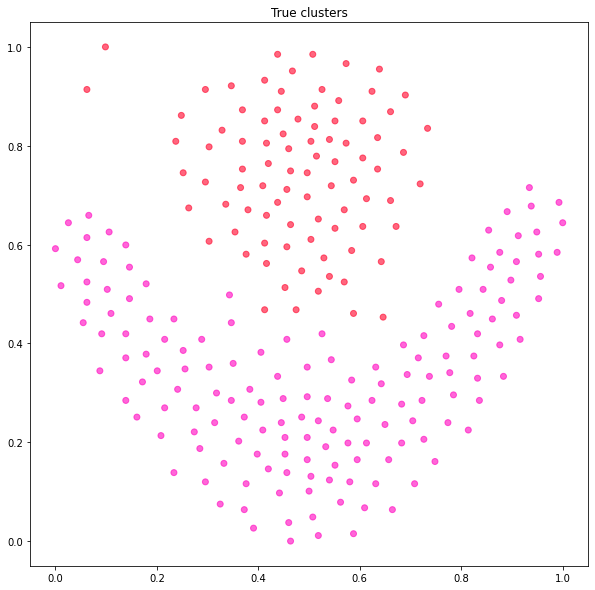

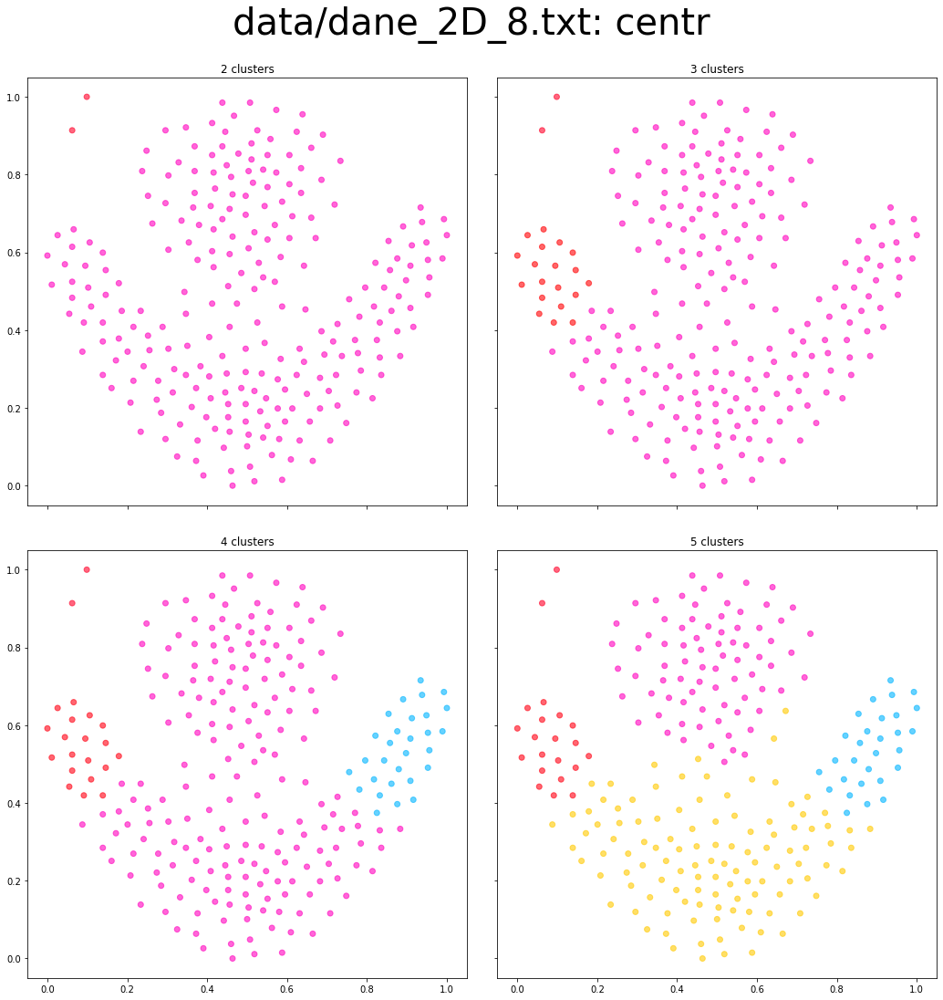

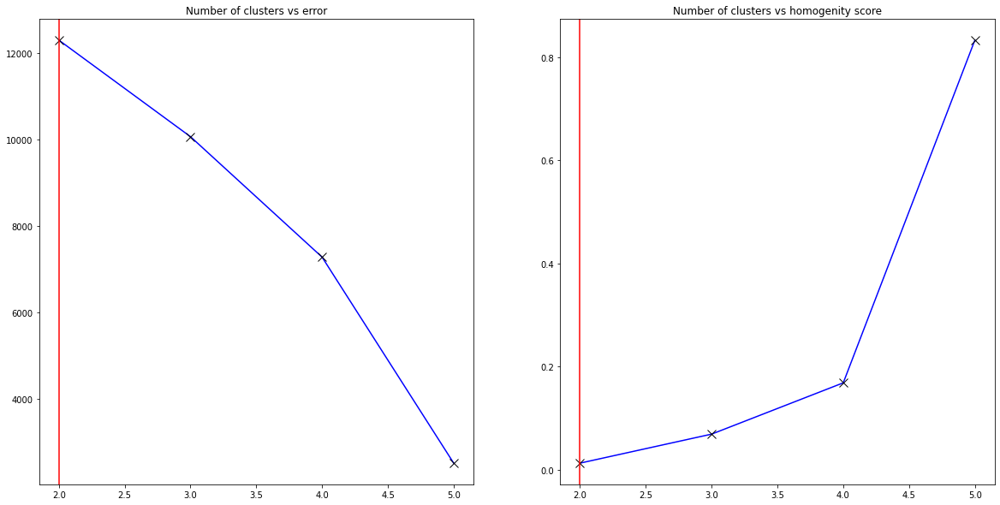

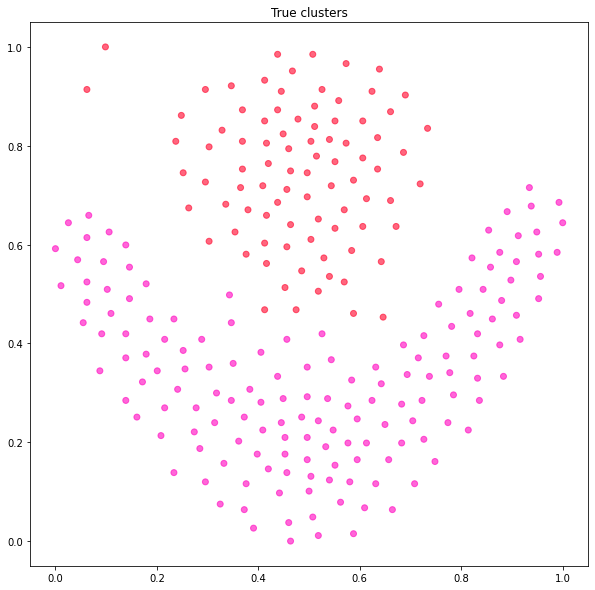

In [7]:
for (dataset, max_k), method in product(zip(DATASETS_2D, DATASETS_2D_Ks), METHODS):
    x, y = get_data_w_labels(dataset)
    y = y.astype(int).flatten() - 1
    handle_2D_dataset(x, y, dataset, method, max_k)


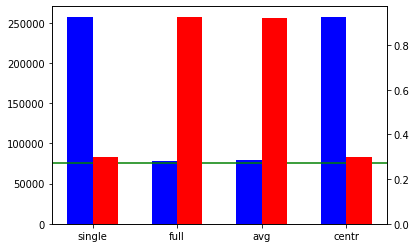

In [8]:
def handle_rp_dataset(x, y):
    errors, homo = [], []
    for method in METHODS:
        ids = Hierarchical(method).cluster(x)[-2]
        errors.append(cost(x, ids))
        homo.append(homogeneity_score(y, ids) ** 0.2)

    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax2 = ax.twinx()

    width = 0.3

    m = np.arange(len(METHODS))
    ax.bar(m - width / 2, errors, color='blue', width=width)
    ax2.bar(m + width / 2, homo, color='red', width=width)
    ax.set_xticks(m)
    ax.set_xticklabels(METHODS)
    ax.axhline(cost(x, y), c='green')

    # textdiwth = len(f'Error after hierarchical ({method}):)') + 4
    # print(f'Error after hierarchical ({method}):'.ljust(textdiwth), f'{cost(x, ids)}')
    # print(f'Error from data:'.ljust(textdiwth), f'{cost(x, y)}')
    # print(f'Homogenity score ({method}):'.ljust(textdiwth), f'{homogeneity_score(y, ids)}')
    # print()


x_rp, y_rp = get_data_w_labels('data/rp.data')
y_rp = np.array(y_rp, dtype=int).flatten()
y_rp[y_rp == 2] = 0
y_rp[y_rp == 4] = 1
handle_rp_dataset(x_rp, y_rp)


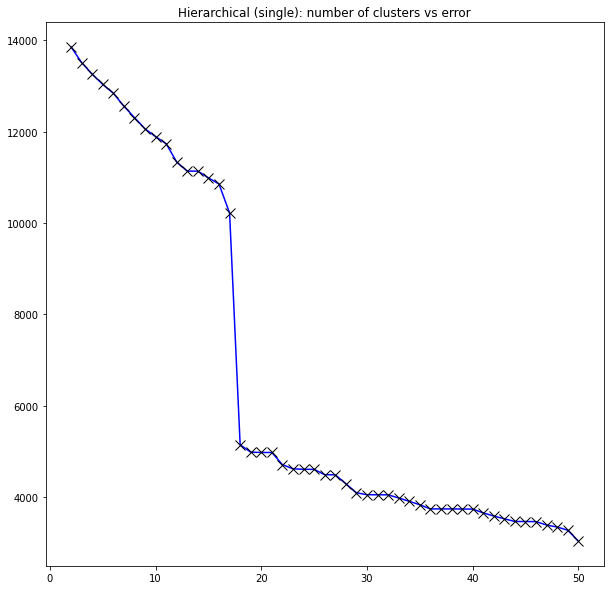

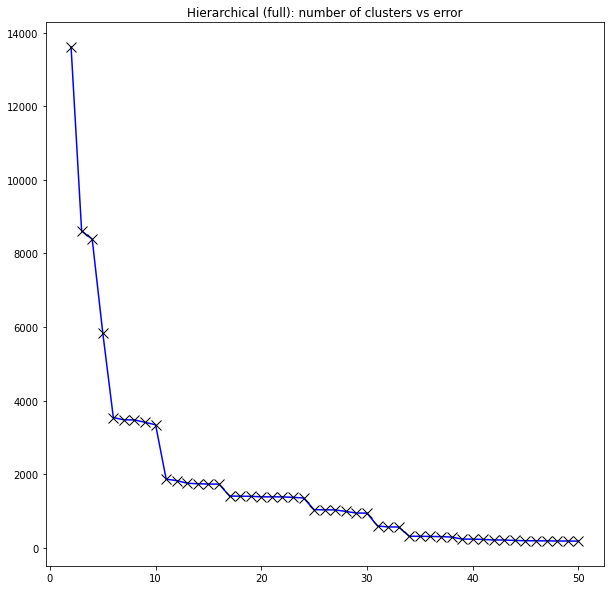

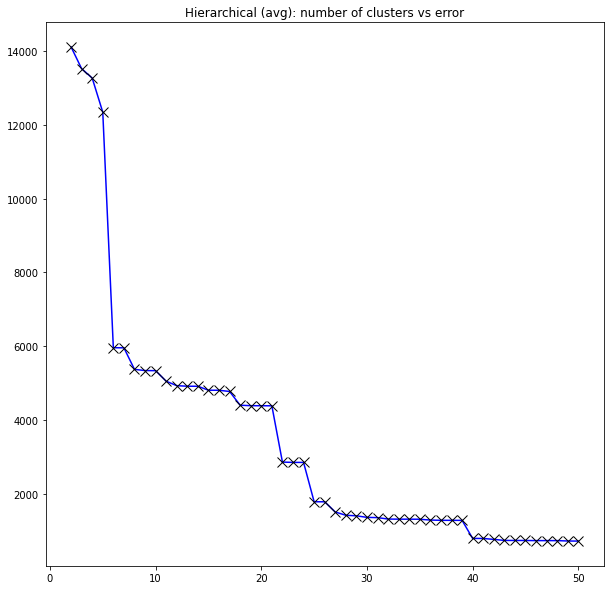

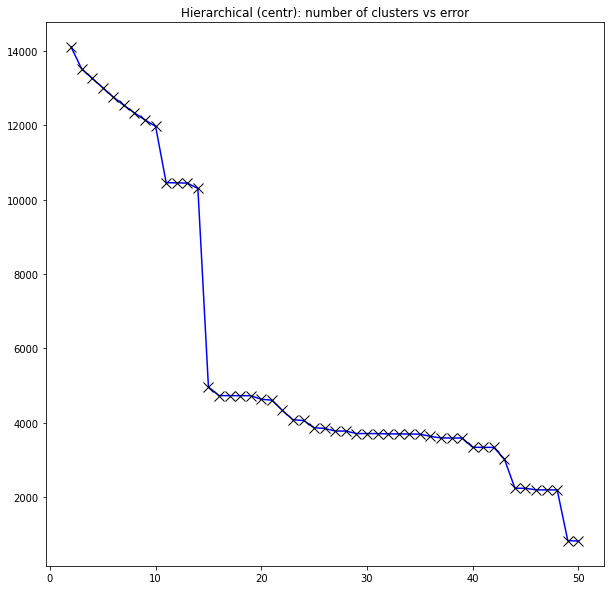

In [9]:
def handle_9D_dataset(x, max_k=50):
    for method in METHODS:
        errors = [cost(x, cids) for cids in Hierarchical(method).cluster(x)[-max_k:-1]][::-1]

        fig, ax_err = plt.subplots(figsize=(10, 10))
        ax_err.set_title(f'Hierarchical ({method}): number of clusters vs error')
        ax_err.plot(range(2, max_k + 1), errors, 'bx-', ms=10, mec='k')


x_9d = get_data_wo_labels('data/dane_9D.txt')
handle_9D_dataset(x_9d)